# Lab 1: Independent Component Analysis

### Machine Learning 2 (2017/2018)

* The lab exercises should be made in groups of two people.
* The deadline is Thursday, April 19, 23:59.
* Assignment should be submitted through BlackBoard! Make sure to include your and your teammates' names with the submission.
* Attach the .IPYNB (IPython Notebook) file containing your code and answers. Naming of the file should be "studentid1\_studentid2\_lab#", for example, the attached file should be "12345\_12346\_lab1.ipynb". Only use underscores ("\_") to connect ids, otherwise the files cannot be parsed.

Notes on implementation:

* You should write your code and answers in an IPython Notebook: http://ipython.org/notebook.html. If you have problems, please ask.
* Use __one cell__ for code and markdown answers only!
    * Put all code in the cell with the ```# YOUR CODE HERE``` comment and overwrite the ```raise NotImplementedError()``` line.
    * For theoretical questions, put your solution using LaTeX style formatting in the YOUR ANSWER HERE cell.
* Among the first lines of your notebook should be "%pylab inline". This imports all required modules, and your plots will appear inline.
* Large parts of you notebook will be graded automatically. Therefore it is important that your notebook can be run completely without errors and within a reasonable time limit. To test your notebook before submission, select Kernel -> Restart \& Run All.

### Literature
In this assignment, we will implement the Independent Component Analysis algorithm as described in chapter 34 of David MacKay's book "Information Theory, Inference, and Learning Algorithms", which is freely available here:
http://www.inference.phy.cam.ac.uk/mackay/itila/book.html

Read the ICA chapter carefuly before you continue!

### Notation

$\mathbf{X}$ is the $M \times T$ data matrix, containing $M$ measurements at $T$ time steps.

$\mathbf{S}$ is the $S \times T$ source matrix, containing $S$ source signal values at $T$ time steps. We will assume $S = M$.

$\mathbf{A}$ is the mixing matrix. We have $\mathbf{X} = \mathbf{A S}$.

$\mathbf{W}$ is the matrix we aim to learn. It is the inverse of $\mathbf{A}$, up to indeterminacies (scaling and permutation of sources).

$\phi$ is an elementwise non-linearity or activation function, typically applied to elements of $\mathbf{W X}$.

### Code
In the following assignments, you can make use of the signal generators listed below.



In [2]:
%pylab inline
import sys
assert sys.version_info[:3] >= (3, 6, 0), "Make sure you have Python 3.6 installed"

# Signal generators
def sawtooth(x, period=0.2, amp=1.0, phase=0.):
    return (((x / period - phase - 0.5) % 1) - 0.5) * 2 * amp

def sine_wave(x, period=0.2, amp=1.0, phase=0.):
    return np.sin((x / period - phase) * 2 * np.pi) * amp

def square_wave(x, period=0.2, amp=1.0, phase=0.):
    return ((np.floor(2 * x / period - 2 * phase - 1) % 2 == 0).astype(float) - 0.5) * 2 * amp

def triangle_wave(x, period=0.2, amp=1.0, phase=0.):
    return (sawtooth(x, period, 1., phase) * square_wave(x, period, 1., phase) + 0.5) * 2 * amp

def random_nonsingular_matrix(d=2):
    """
    Generates a random nonsingular (invertible) matrix of shape d*d
    """
    epsilon = 0.1
    A = np.random.rand(d, d)
    while abs(np.linalg.det(A)) < epsilon:
        A = np.random.rand(d, d)
    return A

def plot_signals(X, title="Signals"):
    """
    Plot the signals contained in the rows of X.
    """
    figure()
    
    for i in range(X.shape[0]):
        ax = plt.subplot(X.shape[0], 1, i + 1)
        plot(X[i, :])
        ax.set_xticks([])
        ax.set_yticks([])
    plt.suptitle(title)

Populating the interactive namespace from numpy and matplotlib


/Users/rubenpolak/miniconda3/lib/python3.6/site-packages/IPython/core/magics/pylab.py:160: UserWarning: pylab import has clobbered these variables: ['copy']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"


The following code generates some toy data to work with.

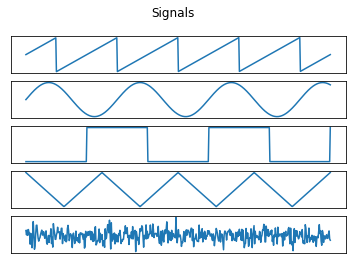

In [3]:
# Generate data
num_sources = 5
signal_length = 500
t = linspace(0, 1, signal_length)
S = np.c_[sawtooth(t), sine_wave(t, 0.3), square_wave(t, 0.4), triangle_wave(t, 0.25), np.random.randn(t.size)].T
plot_signals(S)

### 1.1 Make mixtures (5 points)
Write a function `make_mixtures(S, A)' that takes a matrix of source signals $\mathbf{S}$ and a mixing matrix $\mathbf{A}$, and generates mixed signals $\mathbf{X}$.

In [4]:
### 1.1 Make mixtures
def make_mixtures(S, A):
    # YOUR CODE HERE
    return np.matmul(A,S)

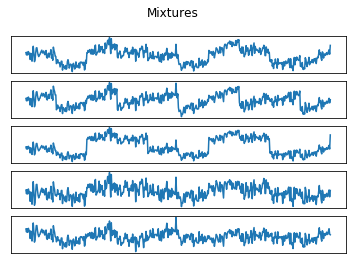

In [5]:
### Test your function
np.random.seed(42)
A = random_nonsingular_matrix(d=S.shape[0])
X = make_mixtures(S, A)
plot_signals(X, "Mixtures")

assert X.shape == (num_sources, signal_length), "The shape of your mixed signals is incorrect"


### 1.2 Histogram (5 points)
Write a function `plot_histograms(X)` that takes a data-matrix $\mathbf{X}$ and plots one histogram for each signal (row) in $\mathbf{X}$. You can use the `np.histogram()` (followed by `plot`) or `plt.hist()` function. 

Plot histograms of the sources and the measurements.

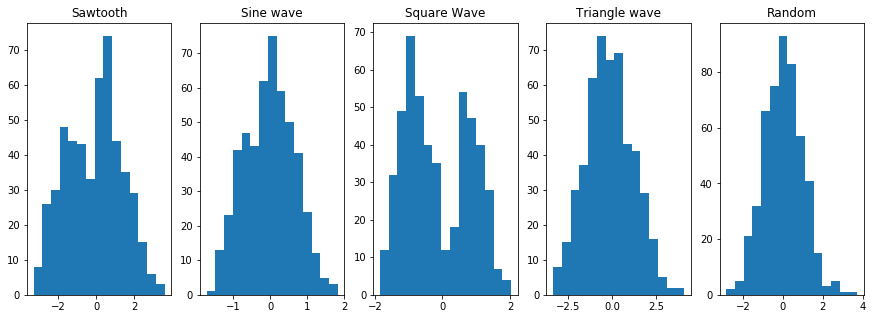

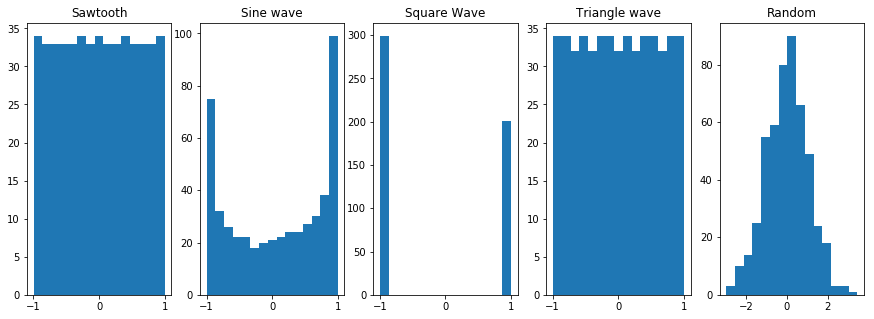

In [6]:
### 1.2 Histogram
# YOUR CODE HERE
def plot_histrograms(X):
    num_bins = 15
    _, (_,_,_,_,_) = plt.subplots(1,5,figsize=(15,5))
    
    titles = ['Sawtooth','Sine wave', 'Square Wave','Triangle wave','Random']
    
    for i in range(X.shape[0]):
        plt.subplot(1,X.shape[0],i+1)
        plt.hist(X[i],bins = num_bins)
        plt.title(titles[i])

    plt.show()
    return

plot_histrograms(X)
plot_histrograms(S)

Which of these distributions (sources or measurements) tend to look more like Gaussians? Can you think of an explanation for this phenomenon? Why is this important for ICA?

YOUR ANSWER HERE

### 1.3 Implicit priors (20 points)
As explained in MacKay's book, an activation function $\phi$ used in the ICA learning algorithm corresponds to a prior distribution over sources. Specifically, $\phi(a) = \frac{d}{da} \ln p(a)$. For each of the following activation functions, *derive* the source distribution they correspond to.
$$\phi_0(a) = -\tanh(a)$$
$$\phi_1(a) = -a + \tanh(a)$$
$$\phi_2(a) = -a^3$$
$$\phi_3(a) = -\frac{6a}{a^2 + 5}$$

Give your answer without the normalizing constant, so an answer of the form $p(a) \propto \verb+[answer]+$ is ok.

To normalize, we make sure that:
$$ k \int_{-\infty}^{\infty} p(a) da = 1 $$thus k is the normalizing constant. $$ $$ 
Case 1:
$$ \int - \tanh(a) da = - \log (\cosh(a)) $$
$$ p(a) =\exp \left[- \log (\cosh(a))  \right] = \frac{1}{\cosh(a)} $$
$$ k \int_{-\infty}^{\infty} \frac{1}{\cosh(a)} da = 1 = \pi $$
$$ k = \pi $$ 
Case 2:
$$ \int -a + \tanh(a) da =  \log (\cosh(a)) - \frac{a^2}{2}  $$ 
$$ p(a) =\exp \left[ \log (\cosh(a)) - \frac{a^2}{2} \right] = \exp^{-0.5a^2} \cosh(a) $$
$$ k \int_{-\infty}^{\infty} \exp^{-0.5a^2} \cosh(a) da = 1 = k \sqrt{2 e \pi} $$
$$ k = \frac{1}{\sqrt{2 e \pi}} $$ 
Case 3:
$$ \int - a^3 da = \frac{-a^4}{4} $$
$$ p(a) =\exp \left[ \frac{-a^4}{4} \right] = \exp^{\frac{-a^4}{4}} $$ 
$$ k \int_{-\infty}^{\infty}\exp^{\frac{-a^4}{4}} da = 1 = k \cdot 2.56369 $$
$$ k = \frac{1}{2.56369} 

Case 4:
$$ \int \frac{-6a}{a^2 + 5} da = -3 \log (a^2 + 5) $$
$$ p(a) = \exp \left[ -3 \log (a^2 + 5) \right] = \frac{1}{(a^2 + 5)^3} $$ 
$$ k \int_{-\infty}^{\infty} \frac{1}{(a^2 + 5)^3} da = 1 = k \frac{3\pi}{200\sqrt{5}} $$
$$ k = \frac{200\sqrt{5}}{3\pi} $$ 

In [7]:
def phi_0(a):
    return -np.tanh(a)

def p_0(a):
    # YOUR CODE HERE
    return 1.0 / (np.cosh(a) * np.pi) 

In [8]:
def phi_1(a):
    return -a + np.tanh(a)

def p_1(a):
    k = 1 / np.sqrt( 2 * np.pi * np.exp(1))
    return k * np.exp(-0.5*(a**2)) * np.cosh(a)

In [9]:
def phi_2(a):
    return -a**3

def p_2(a):
    
    return np.exp(-0.25 * (a**4))

In [10]:
def phi_3(a):
    return -6*a / (a**2 + 5)

def p_3(a):
    # YOUR CODE HERE
    k = 200 * np.sqrt(5) / (3 * np.pi )
    return k / (((a**2) + 5)**3)

In [11]:
activation_functions = [phi_0, phi_1, phi_2, phi_3]
priors = [p_0, p_1, p_2, p_3]

a = np.linspace(-5, 5, 1000)
for prior in priors:
    assert prior(a).shape == (1000, ), "Wrong output shape"


Plot the activation functions and the corresponding prior distributions, from $a = -5$ to $5$ (hint: use the lists defined in the cell above). Compare the shape of the priors to the histogram you plotted in the last question.

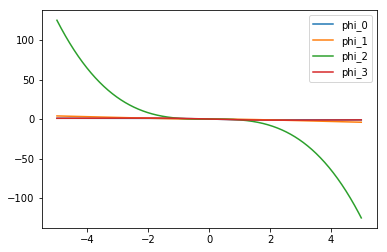

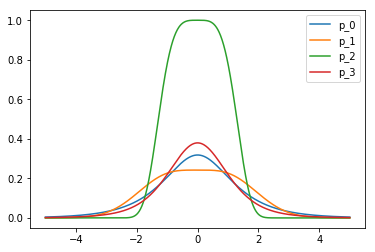

In [12]:
### 1.3 Implicit priors (continued)
a = np.linspace(-5, 5, 1000)

# YOUR CODE HERE
for activation in activation_functions:
    plt.plot(a,activation(a),label=activation.__name__)
plt.legend()
plt.show()

for prior in priors:
    plt.plot(a,prior(a),label=prior.__name__)
plt.legend()
plt.show()

### 1.4 Whitening (15 points)
Some ICA algorithms can only learn from whitened data. Write a method `whiten(X)` that takes a $M \times T$ data matrix $\mathbf{X}$ (where $M$ is the dimensionality and $T$ the number of examples) and returns a whitened matrix. If you forgot what whitening is or how to compute it, various good sources are available online, such as http://courses.media.mit.edu/2010fall/mas622j/whiten.pdf. Your function should also center the data before whitening.

In [13]:
def center(X):
    mu = np.mean(X,1)
    
    mu = mu[np.newaxis]
    
    return X - mu.T

def whiten(X):
    
    Xc = center(X)
    
    U, S, V = np.linalg.svd(Xc, full_matrices=False)
    
    w = np.dot(U, V)
    
    return w

In [14]:
### Test your function
Xw = whiten(X)
assert Xw.shape == (num_sources, signal_length), "The shape of your mixed signals is incorrect"


### 1.5 Interpret results of whitening (10 points)
Make 3 figures, one for the sources, one for measurements and one for the whitened measurements. In each figure, make $5 \times 5$ subplots with scatter plots for each pair of signals. Each axis represents a signal and each time-instance is plotted as a dot in this space. You can use the `plt.scatter()` function. Describe what you see.

Now compute and visualize the covariance matrix of the sources, the measurements and the whitened measurements. You can visualize each covariance matrix using this code:
```python
# Dummy covariance matrix C;
C = np.eye(5)  
ax = imshow(C, cmap='gray', interpolation='nearest')
```

In [15]:
### 1.5 Interpret results of whitening

def visualize_covariances(C):
    return (C @ C.T)

def visualize_signals(signal):
    
    plt.rcParams['figure.figsize'] = [15, 15]
    
    num_signals, _ = signal.shape

    f, axarr = plt.subplots(num_signals, num_signals)
    for i in range(0, num_signals):    
        for j in range(0, num_signals):
            axarr[i,j].scatter(signal[i], signal[j])
            
            if i == 0:
                axarr[i,j].set_title("Signal: " + str(j+1))
            if j == 0:
                axarr[i,j].set_ylabel("Signal: " + str(i+1), size=13)
    
    plt.show()
    
    
    plt.rcParams['figure.figsize'] = [3, 3]
    
    return 



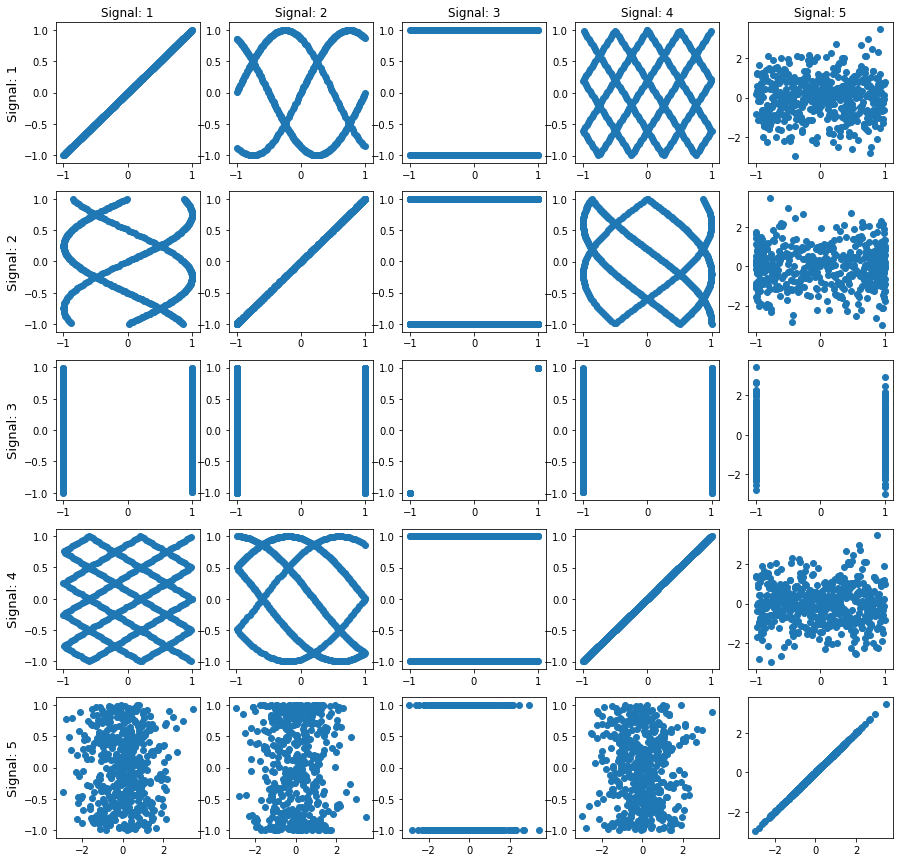

In [16]:
visualize_signals(S)

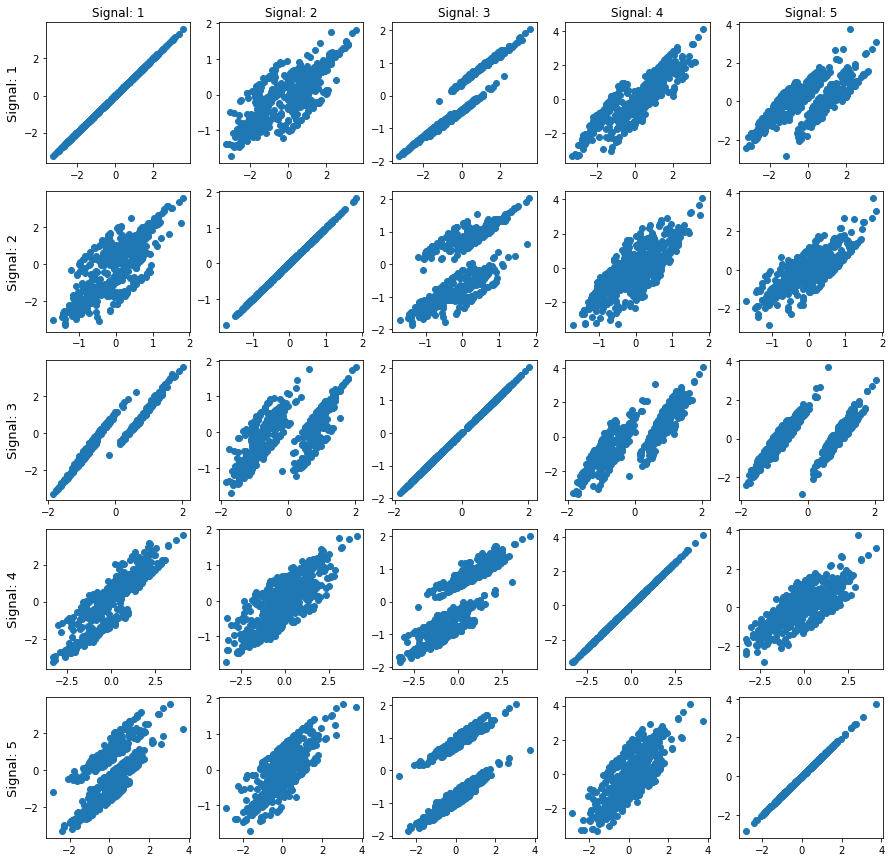

In [17]:
visualize_signals(X)

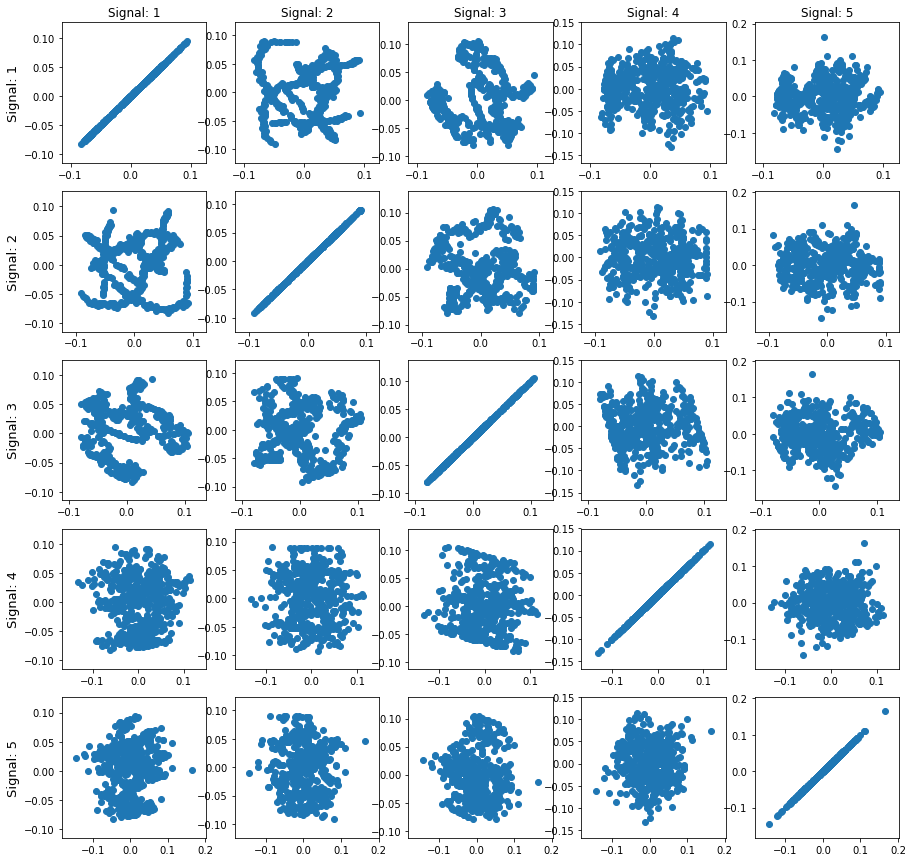

In [18]:
visualize_signals(Xw)

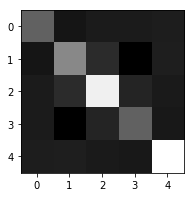

In [19]:
# Visualizing covariances of S:

C = visualize_covariances(S)
imshow(C, cmap='gray', interpolation='nearest')

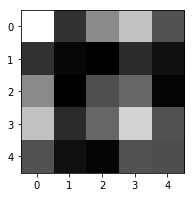

In [20]:
# Visualizing covariances X:

C = visualize_covariances(X)
imshow(C, cmap='gray', interpolation='nearest')

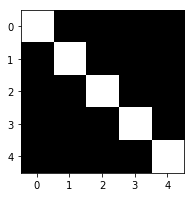

In [21]:
# Visualizing covariances Xw:

C = visualize_covariances(Xw)
imshow(C, cmap='gray', interpolation='nearest')

Are the signals independent after whitening?

ANSWER: Yes, they are completely independent as the Xw plot indicates that there is no correlation between the datapoints. (Datapoints distributed in a circular pattern means no correlation)

### 1.6 Covariance (5 points)
Explain what a covariant algorithm is. 

ANSWER: A covariant algorithm has a learning algorithm in the form: 
$$\Delta w_i = \eta \sum_{i'} M_{ii'} \frac{\partial L }{\partial w_i}$$

Other than having a non-covariant ("steepest descent) algorithm like:
$$\Delta w_i = \eta \frac{\partial L }{\partial w_i}$$
... which does not contain the positive-definite $M$ matrix that makes the algorithm covariant. This M matrix is derived from the curvature and metrics of the log-likelihood, and allows for 

The covariant algorithm allows for consistency in dimensionality and not makes use of matrix inversions, which makes training faster by not having a exponential 'log-like' learning curve.

Source: http://www.inference.org.uk/mackay/ica.pdf

### 1.7 Independent Component Analysis (25 points)
Implement the covariant ICA algorithm as described in MacKay. Write a function `ICA(X, activation_function, learning_rate)`, that returns the demixing matrix $\mathbf{W}$. The input `activation_function` should accept a function such as `lambda a: -tanh(a)`. Update the gradient in batch mode, averaging the gradients over the whole dataset for each update. Make it efficient, so use matrix operations instead of loops where possible (loops are slow in interpreted languages such as python and matlab, whereas matrix operations are internally computed using fast C code). Experiment with the learning rate and the initialization of $\mathbf{W}$. Your algorithm should be able to converge (i.e. `np.linalg.norm(grad) < 1e-5`) in within 10000 steps.

In [32]:
import copy
### 1.7 Independent Component Analysis
def ICA(X, activation_function, learning_rate=0.1,batch_size=1):
    # YOUR CODE HERE
    
    signals, observations = X.shape
    W = random_nonsingular_matrix(signals)
    grad = np.inf
    epochs = 0
    
        
    while grad > 1e-5:     
        
        a = W @ X

        z = activation_function(a)

        x_prime = W.T @ a

        gradientW = W + (z @ x_prime.T) / observations
        
        W += learning_rate * gradientW
        
        grad = np.linalg.norm(gradientW)
        
        epochs += 1
        if epochs % 1000 == 0:
            print("{} steps processed, gradient: {}...".format(epochs, round(np.linalg.norm(grad), 8)))

    print("ICA converged after {} iterations".format(epochs))
    return W
    
W_est = ICA(Xw, phi_0,learning_rate= 0.1)  # Compare with ICA(X)
print( W_est)

1000 steps processed, gradient: 0.45697214...
2000 steps processed, gradient: 0.05692306...
3000 steps processed, gradient: 0.06106024...
4000 steps processed, gradient: 0.06089997...
5000 steps processed, gradient: 0.01779267...
6000 steps processed, gradient: 0.00262065...
7000 steps processed, gradient: 0.00034981...
8000 steps processed, gradient: 4.611e-05...
ICA converged after 8754 iterations
[[ -7.06963272  -4.20399442   4.83644253 -15.42463278 -27.5423154 ]
 [ 24.07581587  16.5632426    0.61983596   8.95524757 -14.11893578]
 [ 18.71392197 -26.77791854   9.44063999  -0.26372458   1.1889576 ]
 [ 11.5454427    1.39653461 -17.19253554 -23.56882338   6.38683103]
 [  3.03014229  12.02455991  26.56235209 -13.80652774  10.12898945]]


In [30]:
### We will test your function so make sure it runs with only X and phi as input, and returns only W
# Also it should converge for all activation functions

W_estimates = [ICA(Xw, activation_function=phi) for phi in activation_functions]
assert all([W_est.shape == (num_sources, num_sources) for W_est in W_estimates])


1000 steps processed, gradient: 0.08568338...
2000 steps processed, gradient: 0.1272077...
3000 steps processed, gradient: 0.01518139...
4000 steps processed, gradient: 0.00185833...
5000 steps processed, gradient: 0.00024212...
6000 steps processed, gradient: 3.182e-05...
ICA converged after 6571 iterations
1000 steps processed, gradient: 0.00211809...
ICA converged after 1857 iterations
1000 steps processed, gradient: 0.00690128...
2000 steps processed, gradient: 1e-05...
ICA converged after 2000 iterations
1000 steps processed, gradient: 0.02592191...
2000 steps processed, gradient: 0.00244865...
3000 steps processed, gradient: 0.00021958...
4000 steps processed, gradient: 1.96e-05...
ICA converged after 4279 iterations


### 1.8 Experiments  (5 points)
Run ICA on the provided signals using each activation function $\phi_0, \ldots, \phi_3$ (or reuse `W_estimates`). Use the found demixing matrix $\mathbf{W}$ to reconstruct the signals and plot the retreived signals for each choice of activation function.

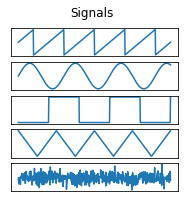

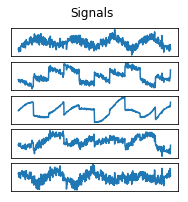

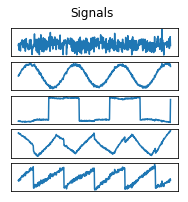

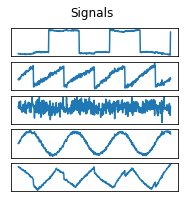

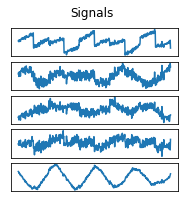

In [85]:
# 1.8 Experiments
# YOUR CODE HERE
plot_signals(S)
for W_est in W_estimates:
    plot_signals(np.dot(W_est,Xw))

In [192]:
import time

def does_whitening_make_a_difference():
    
    # Calculating time to converge for X:
    start_time_X = time.time()
    W_estimates_X = ICA(X, phi_0)
    end_time_X = time.time() - start_time_X
    
    # Calculating time to converge for X whitened:
    start_time_Xw = time.time()
    
    Xw = whiten(X)
    W_estimates_Xw = ICA(Xw, phi_0)
    end_time_Xw = time.time() - start_time_Xw
    
    
    if end_time_Xw == end_time_X:
        print("Xw and X take exactly the same amount of time to converge")
    elif end_time_Xw > end_time_X:
        print("X converges faster than Xw by {} seconds".format(end_time_Xw - end_time_X))
    else:
        print("Xw converges faster than X by {} seconds".format(end_time_X - end_time_Xw))
    
    print(W_estimates_Xw.shape)
    return end_time_Xw != end_time_X

In [210]:
assert type(does_whitening_make_a_difference()) == bool

1000 steps processed, gradient: 0.0066586...
2000 steps processed, gradient: 6.656e-05...
ICA converged after 2409 iterations
1000 steps processed, gradient: 0.00865798...
2000 steps processed, gradient: 8.193e-05...
ICA converged after 2460 iterations
X converges faster than Xw by 0.0016667842864990234 seconds
(5, 5)


### 1.9 Audio demixing (10 points)
The 'cocktail party effect' refers to the ability humans have to attend to one speaker in a noisy room. We will now use ICA to solve a similar but somewhat idealized version of this problem. The code below loads 5 sound files and plots them.

Use a random non-singular mixing matrix to mix the 5 sound files. You can listen to the results in your browser using `play_signals`, or save them to disk if this does not work for you. Plot histograms of the mixed audio and use your ICA implementation to de-mix these and reproduce the original source signals. As in the previous exercise, try each of the activation functions.

Keep in mind that this problem is easier than the real cocktail party problem, because in real life there are often more sources than measurements (we have only two ears!), and the number of sources is unknown and variable. Also, mixing is not instantaneous in real life, because the sound from one source arrives at each ear at a different point in time. If you have time left, you can think of ways to deal with these issues.

In [36]:
import scipy.io.wavfile
from IPython.display import Audio, display, Markdown

# Save mixtures to disk, so you can listen to them in your audio player
def save_wav(data, out_file, rate):
    scaled = np.int16(data / np.max(np.abs(data)) * 32767)
    scipy.io.wavfile.write(out_file, rate, scaled)

# Or play them in your browser
def play_signals(S, sample_rate, title="Signals"):
    display(Markdown(title))
    for signal in S:
        display(Audio(signal, rate=sample_rate))

Signals

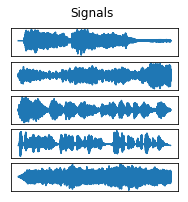

In [44]:
# Load audio sources
source_files = ['beet.wav', 'beet9.wav', 'beet92.wav', 'mike.wav', 'street.wav']
wav_data = []
sample_rate = None
for f in source_files:
    sr, data = scipy.io.wavfile.read(f, mmap=False)
    if sample_rate is None:
        sample_rate = sr
    else:
        assert(sample_rate == sr)
    wav_data.append(data[:190000])  # cut off the last part so that all signals have same length

# Create source and measurement data
S_audio = np.c_[wav_data]
plot_signals(S_audio)
play_signals(S_audio, sample_rate)

Mixing signal sound:


Signals

Mixing signal histograms:


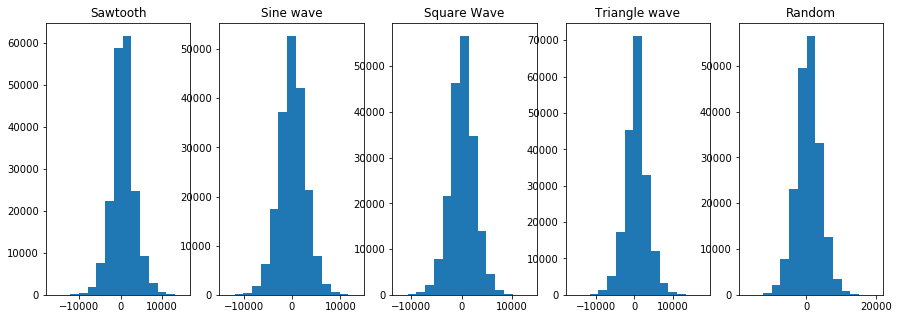

Whitening X audio...


In [45]:
print("Mixing signal sound:")

A_audio = random_nonsingular_matrix(d=S_audio.shape[0])
X_audio = make_mixtures(S_audio, A_audio)

play_signals(X_audio, sample_rate)

print("Mixing signal histograms:")
plot_histrograms(X_audio)

print("Whitening X audio...")
Xw_audio = whiten(X_audio)


In [46]:
print("Running ICA on whitened X_audio using phi_0...\n\n")
W_audio_est = ICA(Xw_audio, phi_0)
S_audio_demixed_0 = np.dot(W_audio_est, Xw_audio)

play_signals(S_audio_demixed_0, sample_rate)

Running ICA on whitened X_audio using phi_0...


1000 steps processed, gradient: 4.698e-05...
ICA converged after 1090 iterations


Signals

In [47]:
print("Running ICA on whitened X_audio using phi_1...\n\n")
W_audio_est = ICA(Xw_audio, phi_1)
S_audio_demixed_1 = np.dot(W_audio_est, Xw_audio)

play_signals(S_audio_demixed_1, sample_rate)

Running ICA on whitened X_audio using phi_1...


1000 steps processed, gradient: 4.24146639...
2000 steps processed, gradient: 1.59669323...
3000 steps processed, gradient: 0.31756011...
4000 steps processed, gradient: 0.08018976...
5000 steps processed, gradient: 0.02075735...
6000 steps processed, gradient: 0.00540758...
7000 steps processed, gradient: 0.00141114...
8000 steps processed, gradient: 0.00036841...
9000 steps processed, gradient: 9.619e-05...
10000 steps processed, gradient: 2.512e-05...
ICA converged after 10686 iterations


Signals

In [48]:
print("Running ICA on whitened X_audio using phi_2...\n\n")
W_audio_est = ICA(Xw_audio, phi_2)
S_audio_demixed_2 = np.dot(W_audio_est, Xw_audio)

play_signals(S_audio_demixed_2, sample_rate)

Running ICA on whitened X_audio using phi_2...


1000 steps processed, gradient: 0.25790091...
2000 steps processed, gradient: 0.09211962...
3000 steps processed, gradient: 0.02594155...
4000 steps processed, gradient: 0.00683668...
5000 steps processed, gradient: 0.00177076...
6000 steps processed, gradient: 0.00045659...
7000 steps processed, gradient: 0.0001176...
8000 steps processed, gradient: 3.028e-05...
ICA converged after 8817 iterations


Signals

In [49]:
print("Running ICA on whitened X_audio using phi_3...\n\n")
W_audio_est = ICA(Xw_audio, phi_3)
S_audio_demixed_3 = np.dot(W_audio_est, Xw_audio)

play_signals(S_audio_demixed_3, sample_rate)

Running ICA on whitened X_audio using phi_3...


1000 steps processed, gradient: 0.00013275...
ICA converged after 1169 iterations


Signals

Report your results. Using which activation functions ICA recovers the sources?

ANSWER: Activation functions $\phi_0$ and $\phi_3$ recover the source sounds correctly.

### 1.10 Excess Kurtosis (15 points)
The (excess) kurtosis is a measure of 'peakedness' of a distribution. It is defined as
$$
\verb+Kurt+[X] = \frac{\mu_4}{\sigma^4} - 3 = \frac{\operatorname{E}[(X-{\mu})^4]}{(\operatorname{E}[(X-{\mu})^2])^2} - 3
$$
Here, $\mu_4$ is known as the fourth moment about the mean, and $\sigma$ is the standard deviation.
The '-3' term is introduced so that a Gaussian random variable has 0 excess kurtosis.
We will now try to understand the performance of the various activation functions by considering the kurtosis of the corresponding priors, and comparing those to the empirical kurtosis of our data.

#### 1.10.1 (10 points)
First, compute analytically the kurtosis of the four priors that you derived from the activation functions before. You may find it helpful to use an online service such as [Wolfram Alpha](https://www.wolframalpha.com/) or [Integral Calculator](https://www.integral-calculator.com/) to (help you) evaluate the required integrals. Give your answer as both an exact expression as well as a numerical approximation (for example $\frac{\pi}{2} \approx 1.571$).

YOUR ANSWER HERE

In [ ]:
### Include your answer here (you can use math.gamma if needed)
def get_kurtosis():
    # Return a list with 4 numbers / expressions
    # return [0, 0, 0, 0]
    
    # YOUR CODE HERE
    raise NotImplementedError()
    

In [ ]:
# Let's check
kurtosis = get_kurtosis()
print (kurtosis)
assert len(kurtosis) == 4


#### 1.10.2 (5 points)
Now use the `scipy.stats.kurtosis` function, with the `fisher` option set to `True`, to compute the empirical kurtosis of the dummy signals and the real audio signals.

Can you use this data to explain the performance of the various activation functions on the synthetic and real data?

In [61]:
from scipy.stats import kurtosis

print("Kurtosis values on synthetic data for phi_0:\n{}\n".format(kurtosis(np.dot(W_estimates[0],Xw), axis=1, fisher=True)))
print("Kurtosis values on synthetic data for phi_1:\n{}\n".format(kurtosis(np.dot(W_estimates[1],Xw), axis=1, fisher=True)))
print("Kurtosis values on synthetic data for phi_2:\n{}\n".format(kurtosis(np.dot(W_estimates[2],Xw), axis=1, fisher=True)))
print("Kurtosis values on synthetic data for phi_3:\n{}\n".format(kurtosis(np.dot(W_estimates[3],Xw), axis=1, fisher=True)))

print("Kurtosis values on real data for phi_0:\n{}\n".format(kurtosis(S_audio_demixed_0, axis=1, fisher=True)))
print("Kurtosis values on real data for phi_1:\n{}\n".format(kurtosis(S_audio_demixed_1, axis=1, fisher=True)))
print("Kurtosis values on real data for phi_2:\n{}\n".format(kurtosis(S_audio_demixed_2, axis=1, fisher=True)))
print("Kurtosis values on real data for phi_3:\n{}\n".format(kurtosis(S_audio_demixed_3, axis=1, fisher=True)))

Kurtosis values on synthetic data for phi_0:
[-0.01212929  0.43350601 -0.44711814  0.21642401  0.18983208]

Kurtosis values on synthetic data for phi_1:
[-1.1561033  -1.09482915 -1.82744103 -0.03336947 -1.48346617]

Kurtosis values on synthetic data for phi_2:
[-1.13326403 -1.48827978 -0.136062   -1.82668242 -1.17761047]

Kurtosis values on synthetic data for phi_3:
[-0.38242845  0.21558815  0.42376249 -0.00129394  0.2174352 ]

Kurtosis values on real data for phi_0:
[ 0.53900835  1.93491515  1.79517752  2.07385653  5.05329978]

Kurtosis values on real data for phi_1:
[ 0.28347674  0.37551843  0.45788937  0.29633921  0.54724277]

Kurtosis values on real data for phi_2:
[ 0.29790447  0.24373638  0.42604855  0.49789257  0.23088033]

Kurtosis values on real data for phi_3:
[ 1.79570229  1.9346942   2.07415496  5.05333868  0.53904861]



ANSWER: From the above test we can conclude that for both synthetic data and real data phi_0 and phi_3 result in higher peakedness (measured by positive valus for kurtosis). This aligns with the conclusions drawn earlier for phi_0 and phi_3, namely that these activations functions demixes the source signals better than phi_1 and phi_2. The reason for this is that real signal are generally very peaked, so a higher kurtosis (peakedness) would generally result in a better demixing signal.